# (02) MNIST—1

**Motivation**: Fit MNIST, fully conv enc + dec. Device = ```cuda:1``` <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
from analysis.eval import sparse_score
from figures.fighelper import *
from vae.train_vae import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 1
device = f'cuda:{device_idx}'

model_type = 'poisson'

## CONV + FF

In [3]:
cfg_vae, cfg_tr = default_configs('MNIST', model_type, 'conv+b|conv+b')
cfg_vae['init_scale'] = 0.1

print(f"VAE:\n{cfg_vae}\n\nTrainer:\n{cfg_tr}")

VAE:
{'dataset': 'MNIST', 'n_ch': 32, 'n_latents': 10, 'prior_clamp': -2.0, 'prior_log_dist': 'uniform', 'rmax_q': 1.0, 
'fit_prior': True, 'enc_type': 'conv', 'dec_type': 'conv', 'enc_bias': True, 'dec_bias': True, 'init_scale': 0.1}

Trainer:
{'lr': 0.002, 'epochs': 1200, 'batch_size': 200, 'warm_restart': 2, 'optimizer_kws': {'weight_decay': 0.0003}, 
'grad_clip': 1000}

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|  PoissonVAE |  6.2 Mil   |
|     ---     |    ---     |
|     stem    |    352     |
|     enc     |  4.9 Mil   |
|    fc_enc   |   2.6 K    |
|    fc_dec   |   11.3 K   |
|     dec     |  1.2 Mil   |
+-------------+------------+

poisson_uniform_c(-2)_MNIST_z-10_k-32_fp_<conv+b|conv+b>
mc_b200-ep1200-lr(0.002)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(1000)_(2024_05_07,05:32)

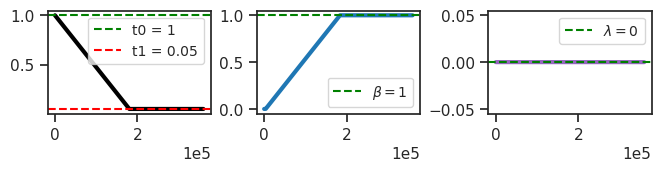

In [4]:
vae = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**cfg_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**cfg_tr), device=device)

vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}_({vae.timestamp})\n")
tr.show_schedules()

In [5]:
vae.fc_dec.bias.shape, vae.fc_enc.bias.shape

(torch.Size([1024]), torch.Size([10]))

In [6]:
tr.cfg.kl_const_portion

0.01

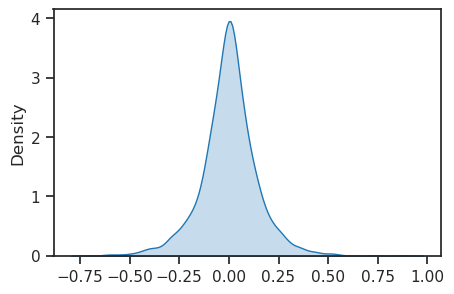

In [7]:
sns.kdeplot(tonp(vae.fc_enc.weight.data.ravel()), fill=True);

### Train

In [ ]:
comment = f"klconst{tr.cfg.kl_const_portion}_gradx3-{vae.cfg.init_dist}Scale{vae.cfg.init_scale}_{tr.cfg.name()}"
# comment = tr.cfg.name()
tr.train(comment=comment)

epoch # 1047, avg loss: 34.394996:  87%|███████████████████▏  | 1047/1200 [3:03:46<25:59, 10.19s/it]

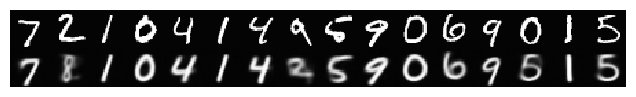

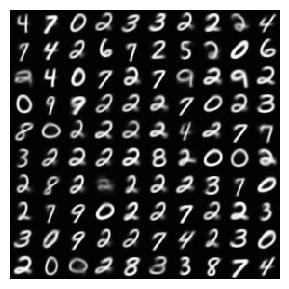

In [64]:
tr.show_recon(0.0), tr.show_samples(0.0);

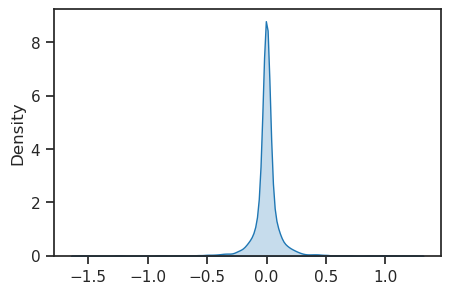

In [65]:
sns.kdeplot(tonp(vae.fc_enc.weight.data.ravel()), fill=True);

### Loss vld (freeze)

In [46]:
data, loss, etc = tr.validate()

_loss = {k: v.mean() for k, v in loss.items()}
_loss['tot'] = _loss['mse'] + _loss['kl']
print(_loss)

{'mse': 27.668684, 'kl': 8.879955, 'kl_diag': 0.88799554, 'tot': 36.548637}

### Identify dead neurons

In [24]:
dead_thres = 0 # 0.002
dead = loss['kl_diag'] < dead_thres
dead.sum()

0

In [25]:
loss['kl_diag']

array([0.7945581 , 0.99305606, 0.7414204 , 0.89932996, 0.92786276,
       0.8128913 , 0.89006346, 0.78200424, 1.02238   , 1.0163884 ],
      dtype=float32)

In [26]:
vae.log_rate.squeeze()

tensor([0.3624, 0.5587, 0.0371, 0.0856, 0.6285, 0.4240, 0.1299, 0.4420, 0.1519,
        0.3700], device='cuda:1', grad_fn=<SqueezeBackward0>)

### Spike counts

In [27]:
lifetime, population, percents = sparse_score(data['z'], cutoff=0.01)
print(percents)

{'0': 51.7, '1': 12.7, '2': 12.1, '3': 9.6, '4': 6.5, '5': 3.7, '6': 2.0, '7': 1.0, '8+': 0.8}

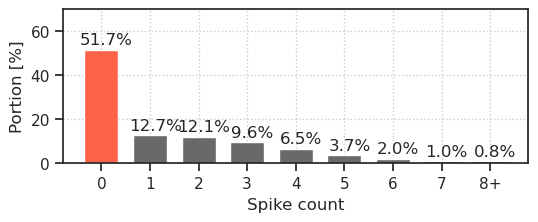

In [28]:
fig, ax = create_figure(1, 1, (6.0, 2.0))

max_val = float(list(percents.values())[0])
ax.set(
    xlabel='Spike count',
    ylabel='Portion [%]',
    ylim=(0, (np.ceil(max_val / 10) + 1) * 10),
)

colors = ['tomato' if lbl == '0' else 'dimgrey' for lbl in percents]
bars = ax.bar(percents.keys(), percents.values(), color=colors, width=0.7)

for bar in bars:
    y = bar.get_height()
    x = bar.get_x() + 1.3 * bar.get_width() / 2
    plt.text(x, y + 1, f'{y:0.1f}%', ha='center', va='bottom')

ax.locator_params(axis='y', nbins=5)

ax.grid()
plt.show()

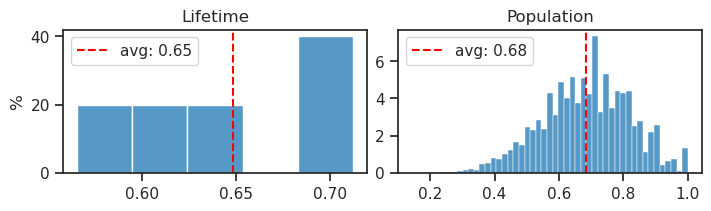

In [29]:
fig, axes = create_figure(1, 2, (7, 2), layout='constrained')

sns.histplot(lifetime, stat='percent', ax=axes[0])
sns.histplot(population, stat='percent', ax=axes[1])

for i, x2p in enumerate([lifetime, population]):
    _a, _med = np.nanmean(x2p), np.nanmedian(x2p)
    # axes[i].axvline(_med, color='g', ls='--', label=f'median: {_med:0.2f}')
    axes[i].axvline(_a, color='r', ls='--', label=f'avg: {_a:0.2f}')

add_legend(axes)
axes[0].set(title='Lifetime', ylabel='%')
axes[1].set(title='Population', ylabel='')
plt.show()

In [30]:
tot_nspks = data['z'][:, ~dead].sum(1)
tot_firing = (data['z'][:, ~dead] > 0).mean(1)

min(tot_nspks), max(tot_nspks)

(0.0, 45.0)

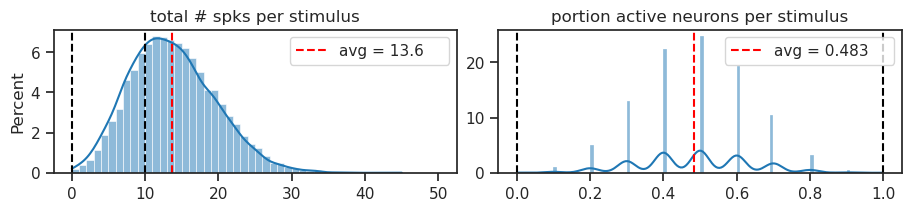

In [31]:
a = np.floor(min(tot_nspks) / 10) * 10
b = np.ceil(max(tot_nspks) / 10) * 10

fig, axes = create_figure(1, 2, (9, 2), layout='constrained')

sns.histplot(tot_nspks, bins=np.linspace(a, b, int(b - a) + 1), kde=True, stat='percent', ax=axes[0])
sns.histplot(tot_firing, bins=np.linspace(0, 1.0, 101), kde=True, stat='percent', ax=axes[1])

_a = tot_nspks.mean()
axes[0].axvline(_a, color='r', ls='--', label=f'avg = {_a:0.1f}    ')
_a = tot_firing.mean()
axes[1].axvline(_a, color='r', ls='--', label=f'avg = {_a:0.3f}    ')

axes[0].axvline(vae.cfg.n_latents, color='k', ls='--')
axes[1].axvline(1.0, color='k', ls='--')

axes[0].set_title('total # spks per stimulus')
axes[1].set(title='portion active neurons per stimulus', ylabel='')

for ax in axes.flat:
    ax.axvline(0, color='k', ls='--')
    ax.legend()
plt.show()

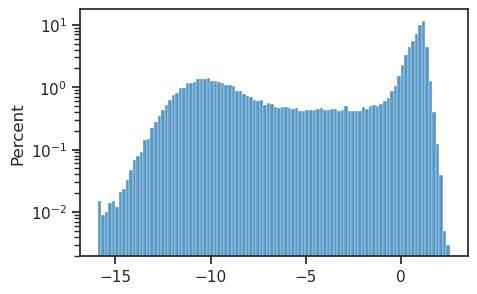

In [32]:
ax = sns.histplot(np.log(etc['r*dr'][:, ~dead].ravel()), stat='percent', bins=100)
ax.set_yscale('log')

### Some more distributions

In [33]:
tr.model.temp, tr.cfg.kl_beta

(tensor(0.0500, device='cuda:1'), 1.0)

In [34]:
log_posterior_rates = np.log(etc['r*dr'][:, ~dead]).ravel()
mu, sd = sp_stats.norm.fit(log_posterior_rates)
rv = sp_stats.norm(mu, sd)

xs = np.linspace(
    rv.ppf(1e-5),
    rv.ppf(1 - 1e-5),
    1000,
)
pdf = rv.pdf(xs)

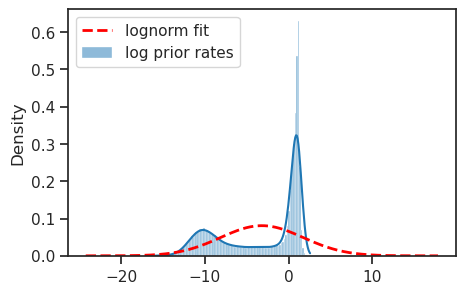

In [35]:
fig, ax = create_figure()

sns.histplot(log_posterior_rates, stat='density', bins=100, kde=True, label='log prior rates', ax=ax)
ax.plot(xs, pdf, color='r', lw=2, ls='--', label='lognorm fit')
add_legend(ax)
plt.show()

In [47]:
def _show_pairwise(i, j):
    df = pd.DataFrame({
        f'z-{i}': etc['r*dr'][:, i],
        f'z-{j}': etc['r*dr'][:, j],
        f'z-{i}_log': np.log(etc['r*dr'][:, i]),
        f'z-{j}_log': np.log(etc['r*dr'][:, j]),
        'lbl': tonp(tr.dl_vld.dataset.tensors[1]).astype(int),
    })
    fig, axes = create_figure(1, 2, (8, 4.5), layout='constrained')
    sns.scatterplot(data=df, x=f'z-{i}', y=f'z-{j}', hue='lbl', palette='tab10', s=20, ax=axes[0])
    sns.scatterplot(data=df, x=f'z-{i}_log', y=f'z-{j}_log', hue='lbl', palette='tab10', s=5, legend=False, ax=axes[1])
    axes[1].axvline(0, color='k', ls='--', lw=1.0, zorder=0)
    axes[1].axhline(0, color='k', ls='--', lw=1.0, zorder=0)
    ax_square(axes)
    plt.show()

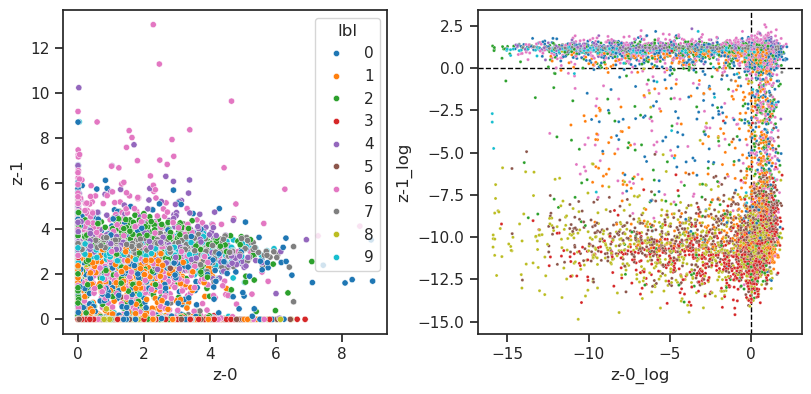

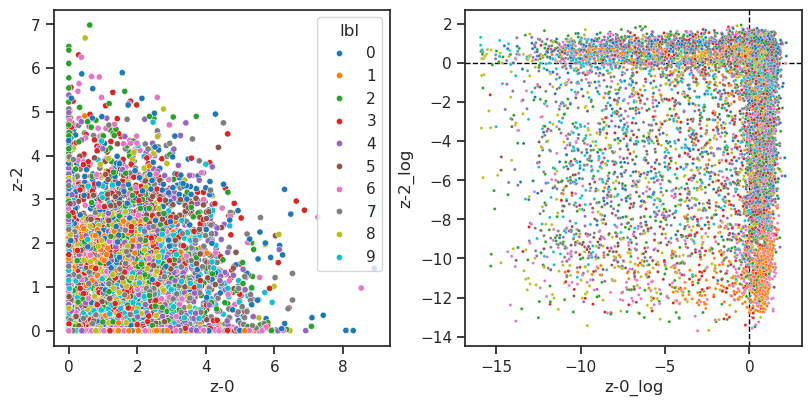

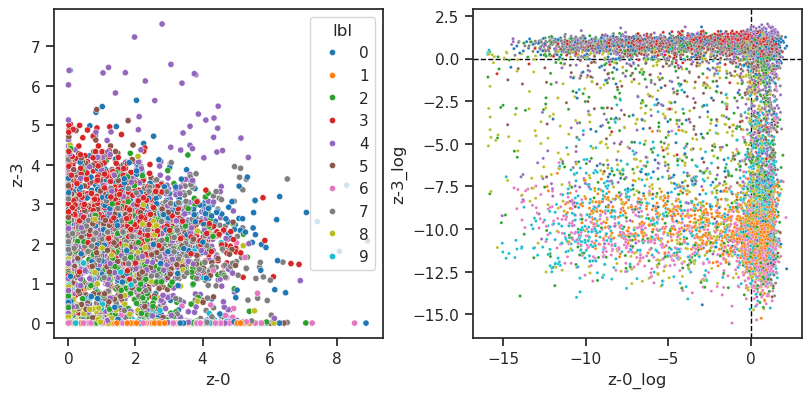

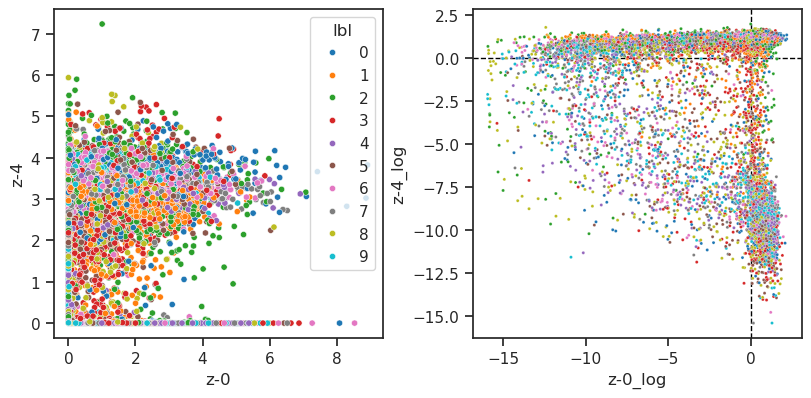

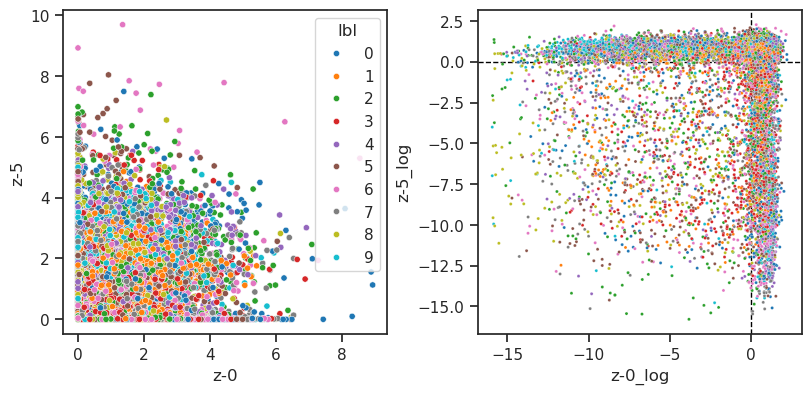

...

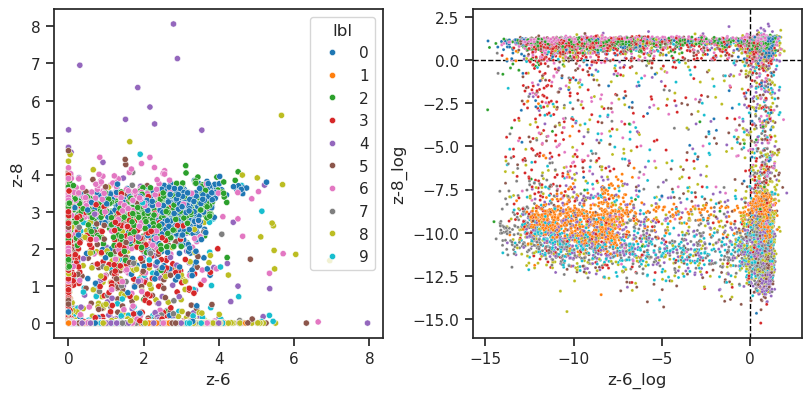

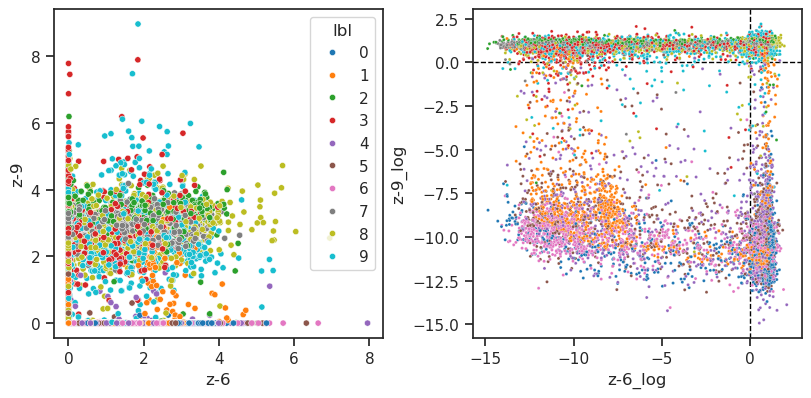

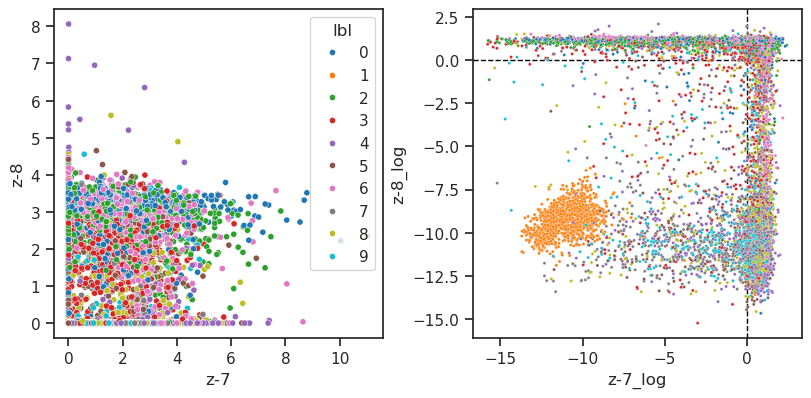

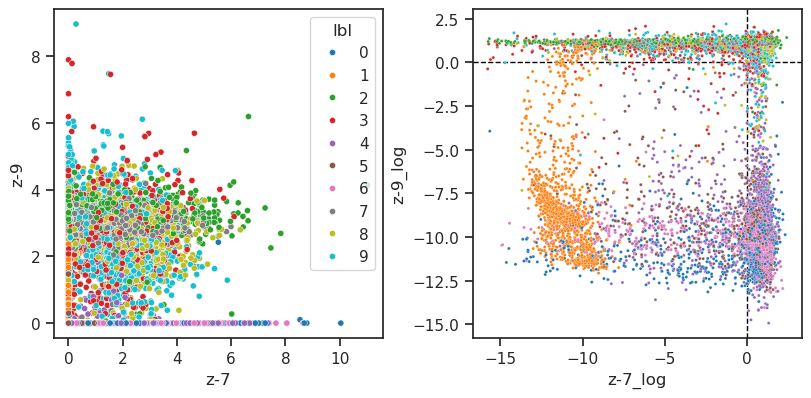

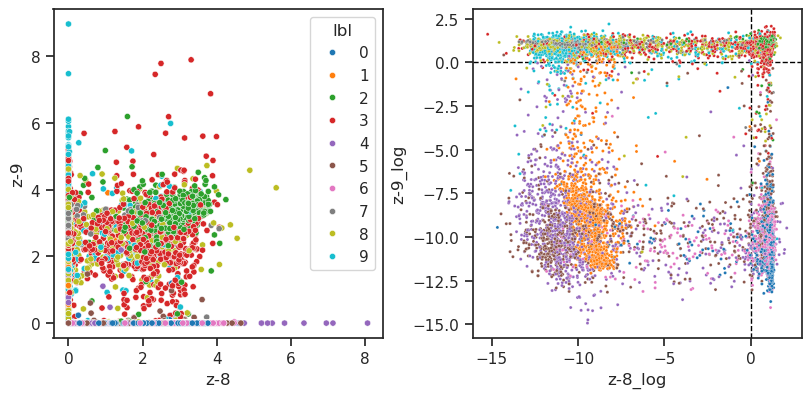

In [48]:
for i, j in list(itertools.combinations(
    range(tr.model.cfg.n_latents), 2)):
    _show_pairwise(i, j)

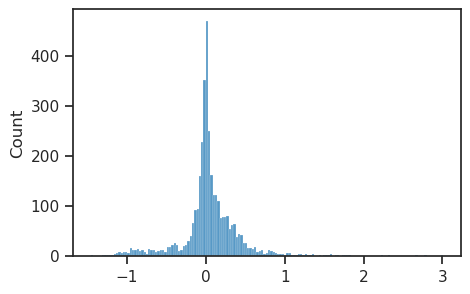

In [49]:
sns.histplot(tonp(torch.cat(vae.all_lognorm)));

In [50]:
(np.array(list(tr.stats['grad'].values())) > 500).sum() / len(tr.stats['grad'])

0.0028277777777777776

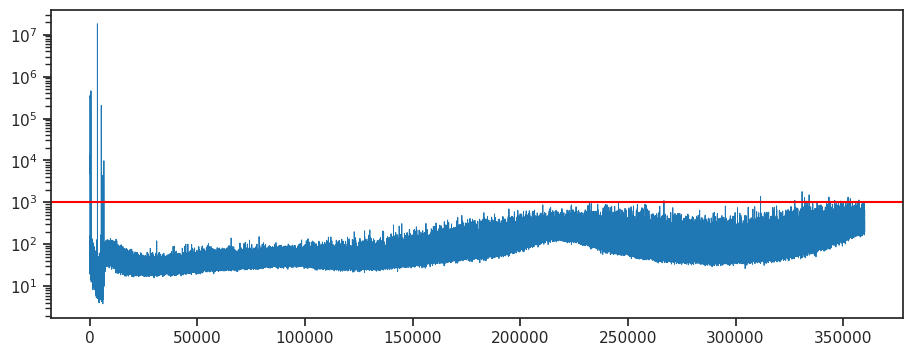

In [51]:
fig, ax = create_figure(1, 1, (11, 4))
plt.plot(tr.stats['grad'].keys(), tr.stats['grad'].values(), lw=0.7)
ax.axhline(tr.cfg.grad_clip, color='r')
ax.set(yscale='log')
plt.show()

In [52]:
df, df_summary = knn_analysis(
    x=etc['log_dr'],
    y=tonp(tr.dl_vld.dataset.tensors[1]),
    n_iter=100,
    verbose=True,
)

train sample size: 20, iter #0:   0%|                             | 0/801 [00:00<?, ?it/s]/home/hadi/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hadi/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hadi/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

In [53]:
df_summary

,mean,std
size,,
20,0.387632,0.052036
50,0.603588,0.051927
100,0.731708,0.036317
200,0.823788,0.021359
500,0.897836,0.011273
1000,0.926260,0.008804
2000,0.937316,0.005775
4000,0.943256,0.002758
5000,0.943800,NaN
